In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d ipateam/segmentation-of-nuclei-in-cryosectioned-he-images

 98% 162M/165M [00:01<00:00, 124MB/s] 
100% 165M/165M [00:01<00:00, 103MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/segmentation-of-nuclei-in-cryosectioned-he-images.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
from PIL import Image
im = Image.open('/content/tissue images/Human_AdrenalGland_01.tif')
im.show()

In [ ]:
opts= {}
opts['imageType_train'] = '.tif'
opts['imageType_test'] = '.tif'
opts['number_of_channel'] = 3                   # '3' for RGB images and '1' for grayscale images
opts['treshold'] = 0.5                          # treshold to convert the network output: (stage 1) to binary masks
## input & output directories
opts['train_dir'] = '/content/tissue_images'
opts['train_label_dir'] = '/content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/mask binary'
opts['train_label_dir_modify'] = '/content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/mask binary without border'
opts['train_label_masks'] = '/content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/label masks modify'
opts['train_dis_dir'] = '/content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/distance maps'


In [ ]:
len(opts['train_dir'])

22

In [ ]:
import numpy as np
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb
import matplotlib.pyplot as plt
from glob import glob                                 # path control
import tqdm
from skimage.io import imsave, imread
from skimage.morphology import label

In [ ]:
train_files = glob('{}*{}'.format(opts['train_dir'], opts['imageType_train']))
train_files_mask = glob('{}*.png'.format(opts['train_label_dir']))
train_files_mask_modify = glob('{}*.png'.format(opts['train_label_dir_modify']))
train_files_dis = glob('{}*.png'.format(opts['train_dis_dir']))
train_files_labels = glob('{}*.tif'.format(opts['train_label_masks']))


train_files.sort()
train_files_mask.sort()
train_files_dis.sort()
train_files_labels.sort()
train_files_mask_modify.sort()
print("Total number of training images:", len(train_files))

Total number of training images: 0


In [ ]:
import os

# Adjust paths based on the Colab environment
base_dir = '/content'
opts['train_dir'] = os.path.join(base_dir, 'tissue images')
opts['train_label_dir'] = os.path.join(base_dir, 'Annotator 1 (biologist second round of manual marks up)', 'Annotator 1 (biologist second round of manual marks up)', 'mask binary')
opts['train_label_dir_modify'] = os.path.join(base_dir, 'Annotator 1 (biologist second round of manual marks up)', 'Annotator 1 (biologist second round of manual marks up)', 'mask binary without border')
opts['train_label_masks'] = os.path.join(base_dir, 'Annotator 1 (biologist second round of manual marks up)', 'Annotator 1 (biologist second round of manual marks up)', 'label masks modify')
opts['train_dis_dir'] = os.path.join(base_dir, 'Annotator 1 (biologist second round of manual marks up)', 'Annotator 1 (biologist second round of manual marks up)', 'distance maps')

# Print adjusted paths for debugging
for key, value in opts.items():
    print(f"{key}: {value}")

# Gather file paths using glob
train_files = glob(os.path.join(opts['train_dir'], '*' + opts['imageType_train']))
train_files_mask = glob(os.path.join(opts['train_label_dir'], '*.png'))
train_files_mask_modify = glob(os.path.join(opts['train_label_dir_modify'], '*.png'))
train_files_dis = glob(os.path.join(opts['train_dis_dir'], '*.png'))
train_files_labels = glob(os.path.join(opts['train_label_masks'], '*.tif'))

# Sort the lists
train_files.sort()
train_files_mask.sort()
train_files_mask_modify.sort()
train_files_dis.sort()
train_files_labels.sort()

# Print the total number of training images
print("Total number of training images:", len(train_files))


imageType_train: .tif
imageType_test: .tif
number_of_channel: 3
treshold: 0.5
train_dir: /content/tissue images
train_label_dir: /content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/mask binary
train_label_dir_modify: /content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/mask binary without border
train_label_masks: /content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/label masks modify
train_dis_dir: /content/Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/distance maps
Total number of training images: 30


In [ ]:
train_files

['/content/tissue images/Human_AdrenalGland_01.tif',
 '/content/tissue images/Human_AdrenalGland_02.tif',
 '/content/tissue images/Human_AdrenalGland_03.tif',
 '/content/tissue images/Human_Larynx_01.tif',
 '/content/tissue images/Human_Larynx_02.tif',
 '/content/tissue images/Human_Larynx_03.tif',
 '/content/tissue images/Human_LymphNodes_01.tif',
 '/content/tissue images/Human_LymphNodes_02.tif',
 '/content/tissue images/Human_LymphNodes_03.tif',
 '/content/tissue images/Human_Mediastinum_01.tif',
 '/content/tissue images/Human_Mediastinum_02.tif',
 '/content/tissue images/Human_Mediastinum_03.tif',
 '/content/tissue images/Human_Pancreas_01.tif',
 '/content/tissue images/Human_Pancreas_02.tif',
 '/content/tissue images/Human_Pancreas_03.tif',
 '/content/tissue images/Human_Pleura_01.tif',
 '/content/tissue images/Human_Pleura_02.tif',
 '/content/tissue images/Human_Pleura_03.tif',
 '/content/tissue images/Human_Skin_01.tif',
 '/content/tissue images/Human_Skin_02.tif',
 '/content/ti

Text(0.5, 1.0, 'label mask')

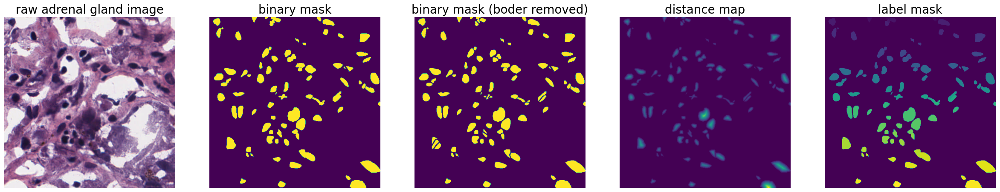

In [ ]:
id = 0
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw adrenal gland image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

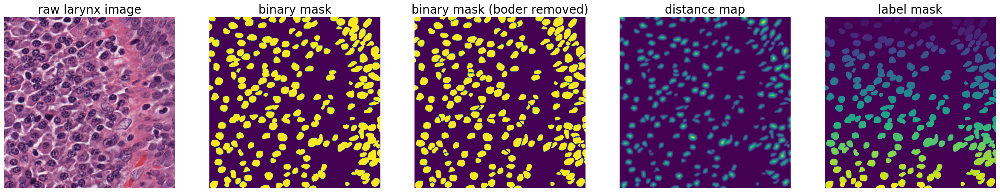

In [ ]:
id = 4
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw larynx image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

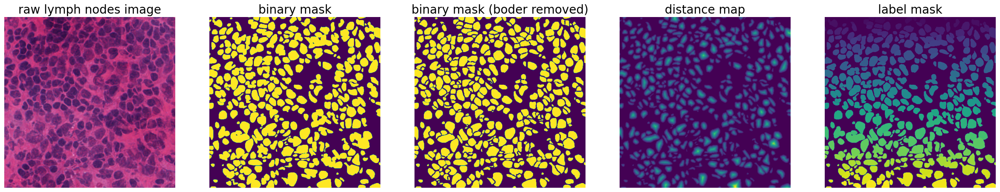

In [ ]:
id = 7
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw lymph nodes image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

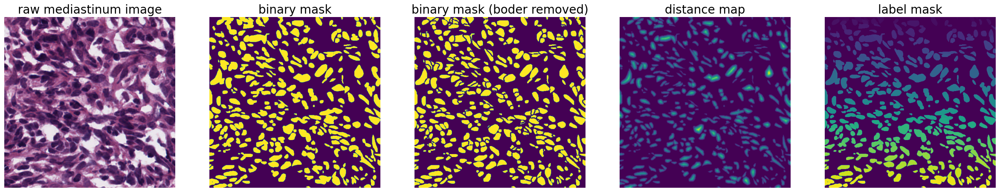

In [ ]:
id = 10
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw mediastinum image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

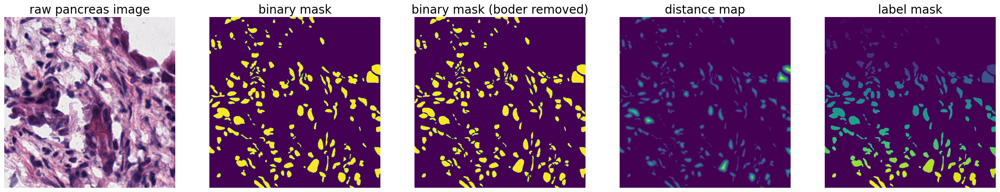

In [ ]:
id = 13
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw pancreas image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

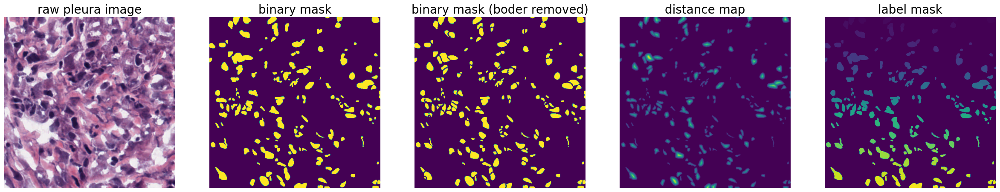

In [ ]:
id = 16
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw pleura image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

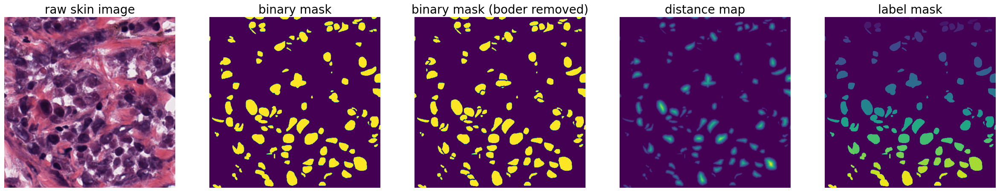

In [ ]:
id = 19
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw skin image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

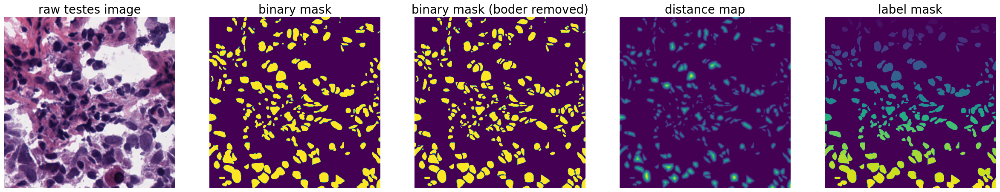

In [ ]:
id = 22
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw testes image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

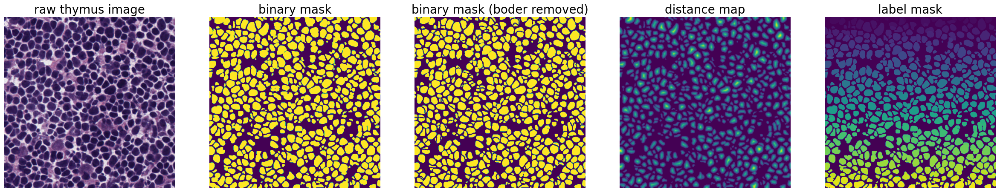

In [ ]:
id = 25
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw thymus image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

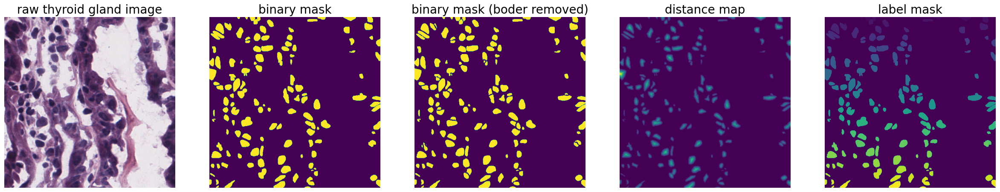

In [ ]:
id = 28
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off')
plt.title('raw thyroid gland image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

In [ ]:
# number of annotated nuclie
count = []
for i in range(len(train_files_labels)):
    img = imread(train_files_labels[i])
    count.append(len(np.unique(img)))

Adrenal_Gland = np.sum(count[0:3])
Larynx        = np.sum(count[3:6])
Lymph_Nodes   = np.sum(count[6:9])
Mediastinum   = np.sum(count[9:12])
Pancreas      = np.sum(count[12:15])
Pleura        = np.sum(count[15:18])
Skin          = np.sum(count[18:21])
Testes        = np.sum(count[21:24])
Thymus        = np.sum(count[24:27])
Thyroid_Gland = np.sum(count[27:30])

print('total number of annotated nuclei is:', np.sum(count))
print('==============================================')
print('total number of annotated adrenal gland nuclei is:', Adrenal_Gland)
print('total number of annotated larynx nuclei is:', Larynx)
print('total number of annotated lymph nodes nuclei is:',Lymph_Nodes)
print('total number of annotated mediastinum nuclei is:', Mediastinum)
print('total number of annotated pancreas nuclei is:', Pancreas)
print('total number of annotated pleura nuclei is:', Pleura)
print('total number of annotated skin nuclei is:', Skin)
print('total number of annotated testes nuclei is:', Testes)
print('total number of annotated thymus nuclei is:', Thymus)
print('total number of annotated thyroid gland nuclei is:', Thyroid_Gland)

total number of annotated nuclei is: 8066
total number of annotated adrenal gland nuclei is: 347
total number of annotated larynx nuclei is: 644
total number of annotated lymph nodes nuclei is: 1311
total number of annotated mediastinum nuclei is: 1350
total number of annotated pancreas nuclei is: 550
total number of annotated pleura nuclei is: 518
total number of annotated skin nuclei is: 436
total number of annotated testes nuclei is: 795
total number of annotated thymus nuclei is: 1648
total number of annotated thyroid gland nuclei is: 467


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose

def create_unet(input_shape=(512, 512, 3)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # ...

    # Decoder
    up3 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv2), conv1], axis=3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)

    # ...

    # Output layer
    output = Conv2D(1, (1, 1), activation='sigmoid')(conv3)  # Using 'conv3' instead of 'conv9'

    model = Model(inputs=[inputs], outputs=[output])
    return model

# Example usage:
input_shape = (512, 512, 3)
model = create_unet(input_shape)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 512, 512, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 256, 256, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [ ]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Stain_Normalization**

In [ ]:
!pip install staintools


  Preparing metadata (setup.py) ... done
  Created wheel for staintools: filename=staintools-2.1.2-py3-none-any.whl size=14051 sha256=f3268fc7bd3292ce329f286ba32e561a94fb00c225913b7cb7252ffaf000254d
  Stored in directory: /root/.cache/pip/wheels/83/01/30/d5b79f92442193b7e3229cb20fb8458e765594cc2251f87ae6
Successfully built staintools


In [ ]:
!pip install spams

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for spams: filename=spams-2.6.5.4-cp310-cp310-linux_x86_64.whl size=3931992 sha256=44442ff1c6f6a27b9419ec5bb3c7de7a04e9de51781b3de2166355d73881894b
  Stored in directory: /root/.cache/pip/wheels/67/9d/1f/60a6c60785b07ad4f087297f04b723e665a97afcd5112ffb06
Successfully built spams


In [ ]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize
# from staintools import ReinhardColorNormalizer, MacenkoColorNormalizer, VahadaneColorNormalizer
stainNorm_Macenko='/content/stainNorm_Macenko.py'
stainNorm_Reinhard='/content/stainNorm_Reinhard.py'
stainNorm_Vahadane='/content/stainNorm_Vahadane.py'
stain_utils='/content/stain_utils.py'
import stainNorm_Reinhard
import stainNorm_Macenko
import stainNorm_Vahadane
import stain_utils as utils
import numpy as np
import matplotlib.pyplot as plt

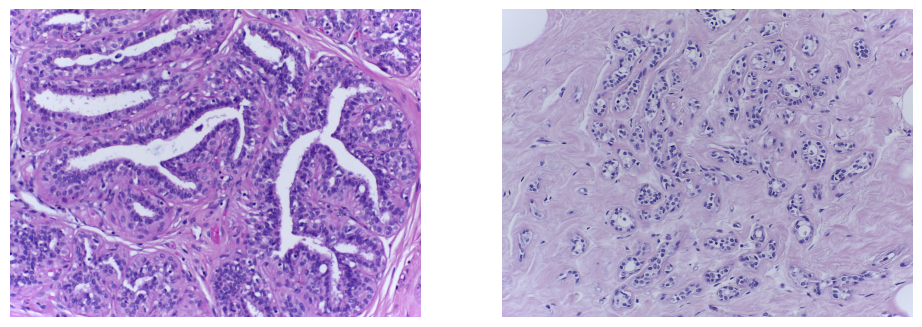

In [ ]:
i1=utils.read_image('/content/i1.png')
i2=utils.read_image('/content/i2.png')
stack=utils.build_stack((i1,i2))
utils.patch_grid(stack,width=3,save_name='./original.pdf')
n=stainNorm_Reinhard.Normalizer()
n.fit(i1)
normalized=utils.build_stack((i1,n.transform(i2)))
# utils.patch_grid(n,width=3 ,save_name='Reinhard.pdf')
# stack=utils.build_stack((i1))
# utils.patch_grid(stack,width=3,save_name='./original.pdf')

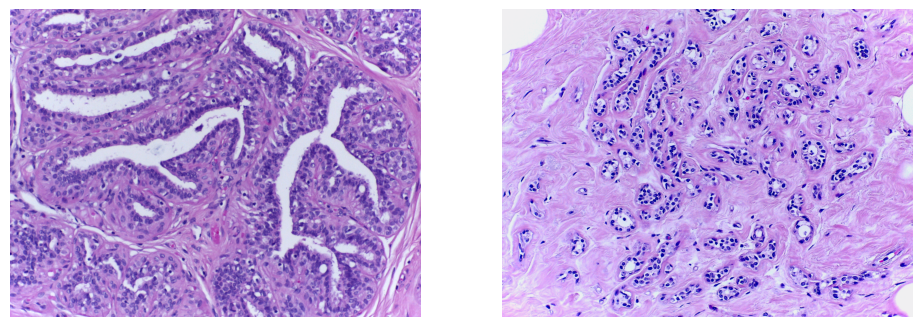

In [ ]:
utils.patch_grid(normalized,width=3,save_name='Reinhard.pdf')

In [ ]:
n=stainNorm_Macenko.Normalizer()
n.fit(i1)
normalized=utils.build_stack((i1,n.transform(i2)))

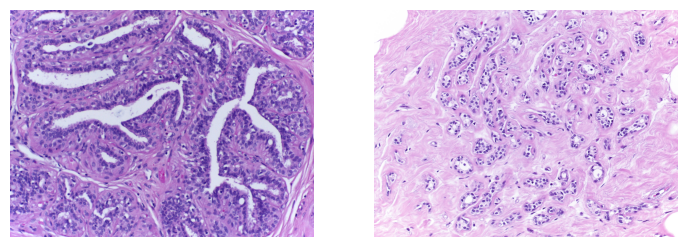

In [ ]:
utils.patch_grid(normalized,width=4,save_name='./challenge_Macenko.pdf')


**By Reinhard Normalizer**

In [ ]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize

# Function to load and preprocess images
def load_images(file_paths, image_size):
    images = []
    normalizer = stainNorm_Reinhard.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        image = imread(file_path)[:, :, :3] / 255.0  # Normalize to [0, 1]

            # Apply stain normalization if specified
        normalizer.fit(image)
        image = normalizer.transform(image)

        image = normalize(image)  # Further normalization if needed
        # Add any additional preprocessing steps here
        images.append(image)
    return np.array(images)

# Function to load label masks
# Function to load label masks
def load_masks(file_paths, image_size):
    masks = []
    normalizer = stainNorm_Reinhard.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        mask = imread(file_path)

        # # Check if the image is grayscale
        # if len(mask.shape) == 2:
        #     mask = np.expand_dims(mask, axis=-1)  # Add a single channel for compatibility

        mask = mask / 255.0  # Normalize to [0, 1]

        # Apply stain normalization if specified

          # Further normalization if needed
        # Add any additional preprocessing steps here
        masks.append(mask)

    return np.array(masks)


# Assuming you have defined image_size (adjust based on your requirements)
image_size = (512, 512)
# normalization_method = 'Reinhard'  # Change this to the desired method

# Load and preprocess the data
X_train = load_images(train_files, image_size)
y_train = load_masks(train_files_mask, image_size)

# (Optional) Split the data into training and validation sets
# You can use tools like train_test_split from sklearn
# Example:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Display the shapes of the loaded data
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)


X_train shape: (24, 512, 512, 3)
y_train shape: (24, 512, 512)
X_test shape: (6, 512, 512, 3)
y_test shape: (6, 512, 512)


Epoch 1/10
6/6 [==============================] - 25s 946ms/step - loss: 0.6616 - dice_coefficient: 0.3384 - val_loss: 0.5840 - val_dice_coefficient: 0.4636
Epoch 2/10
6/6 [==============================] - 2s 375ms/step - loss: 0.6070 - dice_coefficient: 0.3930 - val_loss: 0.5098 - val_dice_coefficient: 0.5312
Epoch 3/10
6/6 [==============================] - 2s 377ms/step - loss: 0.4542 - dice_coefficient: 0.5458 - val_loss: 0.3654 - val_dice_coefficient: 0.6545
Epoch 4/10
6/6 [==============================] - 2s 377ms/step - loss: 0.3072 - dice_coefficient: 0.6928 - val_loss: 0.2762 - val_dice_coefficient: 0.7397
Epoch 5/10
6/6 [==============================] - 2s 378ms/step - loss: 0.2905 - dice_coefficient: 0.7095 - val_loss: 0.2526 - val_dice_coefficient: 0.7567
Epoch 6/10
6/6 [==============================] - 2s 380ms/step - loss: 0.2928 - dice_coefficient: 0.7072 - val_loss: 0.3854 - val_dice_coefficient: 0.6559
Epoch 7/10
6/6 [==============================] - 2s 416ms/step

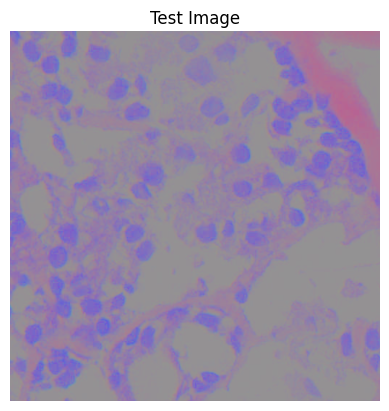

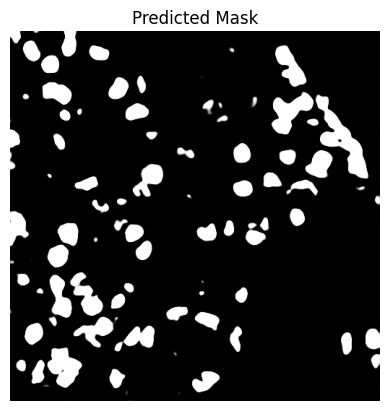

In [ ]:
from tensorflow.keras.losses import binary_crossentropy
import tensorflow as tf

# Define the Dice coefficient function
def dice_coefficient(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Define the Dice loss function
def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)

# Assuming you already have the U-Net model created and compiled (as 'model')

# Step 2: Load and preprocess data
# ... (use the provided code to load and preprocess the data)

# Step 3: Compile the model with Dice loss
model.compile(optimizer='adam', loss=dice_loss, metrics=[dice_coefficient])

# Step 4: Train the model
# Assuming you have separate arrays for training images and masks
model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_val, y_val))

# Step 5: Evaluate the model (optional)
# Assuming you have separate arrays for validation images and masks
loss, dice_coeff = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Dice Coefficient: {dice_coeff}")

# Step 6: Make predictions
# Assuming you have a test set (X_test) for which you want to make predictions
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()


**By Macenko Normalizer**

In [ ]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize

# Function to load and preprocess images
def load_images(file_paths, image_size):
    images = []
    normalizer = stainNorm_Macenko.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        image = imread(file_path)[:, :, :3] / 255.0  # Normalize to [0, 1]

            # Apply stain normalization if specified
        normalizer.fit(image)
        image = normalizer.transform(image)

        image = normalize(image)  # Further normalization if needed
        # Add any additional preprocessing steps here
        images.append(image)
    return np.array(images)

# Function to load label masks
# Function to load label masks
def load_masks(file_paths, image_size):
    masks = []


    for file_path in file_paths:
        mask = imread(file_path)

        # # Check if the image is grayscale
        # if len(mask.shape) == 2:
        #     mask = np.expand_dims(mask, axis=-1)  # Add a single channel for compatibility

        mask = mask / 255.0  # Normalize to [0, 1]

        # Apply stain normalization if specified

          # Further normalization if needed
        # Add any additional preprocessing steps here
        masks.append(mask)

    return np.array(masks)


# Assuming you have defined image_size (adjust based on your requirements)
image_size = (512, 512)
# normalization_method = 'Reinhard'  # Change this to the desired method

# Load and preprocess the data
X_train = load_images(train_files, image_size)
y_train = load_masks(train_files_mask, image_size)

# (Optional) Split the data into training and validation sets
# You can use tools like train_test_split from sklearn
# Example:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Display the shapes of the loaded data
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)


X_train shape: (24, 512, 512, 3)
y_train shape: (24, 512, 512)
X_test shape: (6, 512, 512, 3)
y_test shape: (6, 512, 512)


Epoch 1/10
6/6 [==============================] - 5s 464ms/step - loss: 0.4037 - dice_coefficient: 0.5963 - val_loss: 0.2565 - val_dice_coefficient: 0.7503
Epoch 2/10
6/6 [==============================] - 2s 352ms/step - loss: 0.3296 - dice_coefficient: 0.6704 - val_loss: 0.2547 - val_dice_coefficient: 0.7571
Epoch 3/10
6/6 [==============================] - 2s 355ms/step - loss: 0.2854 - dice_coefficient: 0.7146 - val_loss: 0.2579 - val_dice_coefficient: 0.7559
Epoch 4/10
6/6 [==============================] - 2s 358ms/step - loss: 0.2783 - dice_coefficient: 0.7217 - val_loss: 0.2571 - val_dice_coefficient: 0.7579
Epoch 5/10
6/6 [==============================] - 2s 392ms/step - loss: 0.2822 - dice_coefficient: 0.7178 - val_loss: 0.2677 - val_dice_coefficient: 0.7503
Epoch 6/10
6/6 [==============================] - 2s 397ms/step - loss: 0.2726 - dice_coefficient: 0.7274 - val_loss: 0.2434 - val_dice_coefficient: 0.7697
Epoch 7/10
6/6 [==============================] - 2s 366ms/step 

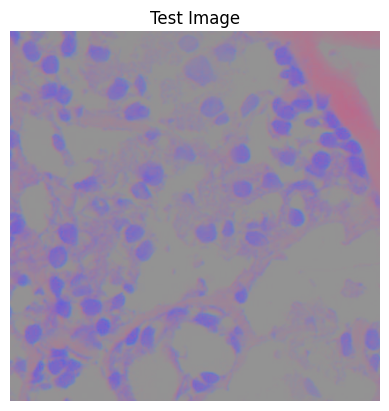

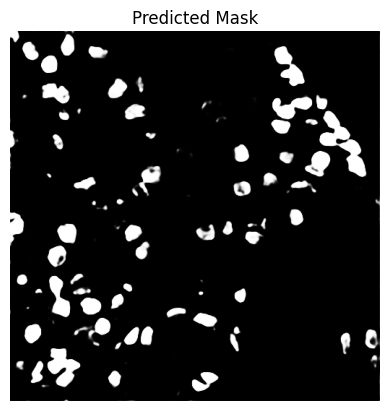

In [ ]:
import tensorflow as tf

# Define the Dice coefficient function
def dice_coefficient(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Define the Dice loss function
def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)

# Assuming you already have the U-Net model created and compiled (as 'model')

# Step 2: Load and preprocess data
# ... (use the provided code to load and preprocess the data)

# Step 3: Compile the model with Dice loss
model.compile(optimizer='adam', loss=dice_loss, metrics=[dice_coefficient])

# Step 4: Train the model
# Assuming you have separate arrays for training images and masks
model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_val, y_val))

# Step 5: Evaluate the model (optional)
# Assuming you have separate arrays for validation images and masks
loss, dice_coeff = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Dice Coefficient: {dice_coeff}")

# Step 6: Make predictions
# Assuming you have a test set (X_test) for which you want to make predictions
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()


**By Vahadane Normalizer**

In [ ]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize

# Function to load and preprocess images
def load_images(file_paths, image_size):
    images = []
    normalizer = stainNorm_Vahadane.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        image = imread(file_path)[:, :, :3] / 255.0  # Normalize to [0, 1]

            # Apply stain normalization if specified
        normalizer.fit(image)
        image = normalizer.transform(image)

        image = normalize(image)  # Further normalization if needed
        # Add any additional preprocessing steps here
        images.append(image)
    return np.array(images)

# Function to load label masks
# Function to load label masks
def load_masks(file_paths, image_size):
    masks = []
    normalizer = stainNorm_Reinhard.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        mask = imread(file_path)

        # # Check if the image is grayscale
        # if len(mask.shape) == 2:
        #     mask = np.expand_dims(mask, axis=-1)  # Add a single channel for compatibility

        mask = mask / 255.0  # Normalize to [0, 1]

        # Apply stain normalization if specified

          # Further normalization if needed
        # Add any additional preprocessing steps here
        masks.append(mask)

    return np.array(masks)


# Assuming you have defined image_size (adjust based on your requirements)
image_size = (512, 512)
# normalization_method = 'Reinhard'  # Change this to the desired method

# Load and preprocess the data
X_train = load_images(train_files, image_size)
y_train = load_masks(train_files_mask, image_size)

# (Optional) Split the data into training and validation sets
# You can use tools like train_test_split from sklearn
# Example:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Display the shapes of the loaded data
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)


/usr/local/lib/python3.10/dist-packages/spams/spams.py:1834: FutureWarning: In the future `np.bool` will be defined as the corresponding NumPy scalar.
  np.array([[False], [False]], dtype=np.bool, order="F"))


AttributeError: module 'numpy' has no attribute 'bool'.
`np.bool` was a deprecated alias for the builtin `bool`. To avoid this error in existing code, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

Epoch 1/10
6/6 [==============================] - 7s 449ms/step - loss: 0.9191 - accuracy: 0.7691 - val_loss: 0.9039 - val_accuracy: 0.7293
Epoch 2/10
6/6 [==============================] - 2s 335ms/step - loss: 0.8957 - accuracy: 0.7691 - val_loss: 0.8904 - val_accuracy: 0.7293
Epoch 3/10
6/6 [==============================] - 2s 337ms/step - loss: 0.8882 - accuracy: 0.7541 - val_loss: 0.8920 - val_accuracy: 0.7194
Epoch 4/10
6/6 [==============================] - 2s 337ms/step - loss: 0.8933 - accuracy: 0.7505 - val_loss: 0.8864 - val_accuracy: 0.6842
Epoch 5/10
6/6 [==============================] - 2s 338ms/step - loss: 0.8848 - accuracy: 0.7498 - val_loss: 0.8830 - val_accuracy: 0.7137
Epoch 6/10
6/6 [==============================] - 2s 339ms/step - loss: 0.8730 - accuracy: 0.7400 - val_loss: 0.8796 - val_accuracy: 0.7157
Epoch 7/10
6/6 [==============================] - 2s 343ms/step - loss: 0.8700 - accuracy: 0.7485 - val_loss: 0.8692 - val_accuracy: 0.6976
Epoch 8/10
6/6 [====

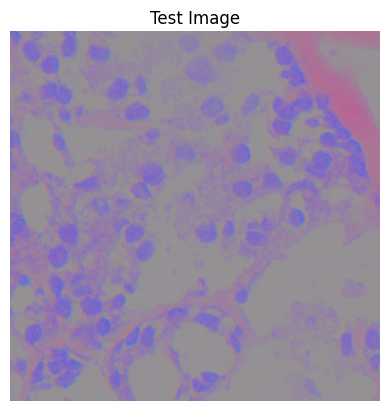

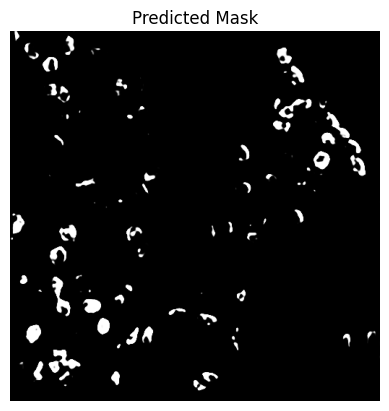

In [ ]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D

# Step 3: Compile the model with Dice Loss
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return 1 - numerator / (denominator + tf.keras.backend.epsilon())

model.compile(optimizer='adam', loss=dice_loss, metrics=['accuracy'])

# Step 4: Train the model
# Assuming you have separate arrays for training images and masks
model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_val, y_val))

# Step 5: Evaluate the model (optional)
# Assuming you have separate arrays for validation images and masks
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Validation Accuracy: {accuracy}")

# Step 6: Make predictions
# Assuming you have a test set (X_test) for which you want to make predictions
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()


1/1 [==============================] - 0s 33ms/step


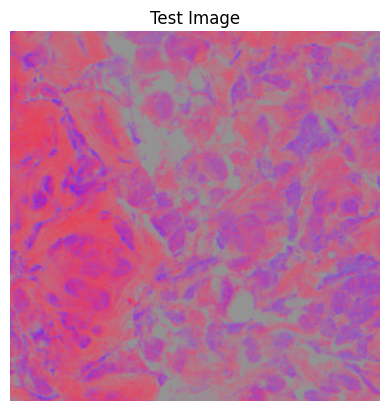

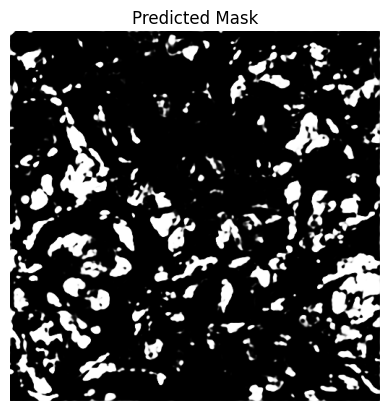

In [ ]:
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 1 # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

1/1 [==============================] - 0s 26ms/step


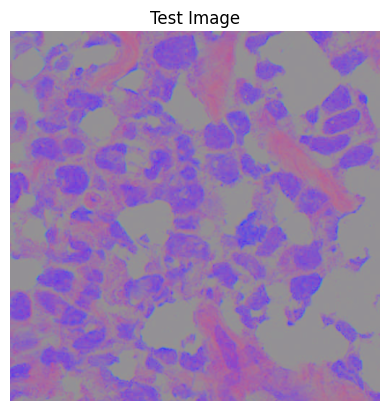

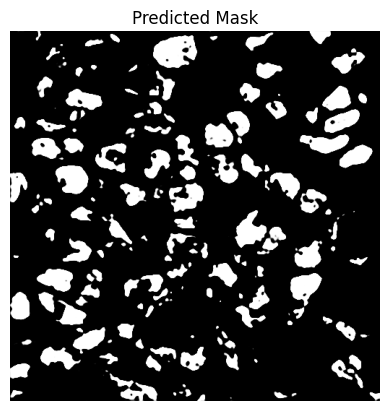

In [ ]:
 predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 2 # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

1/1 [==============================] - 0s 33ms/step


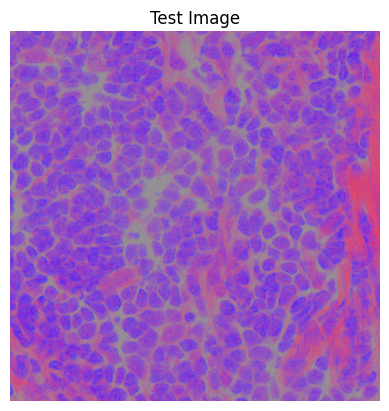

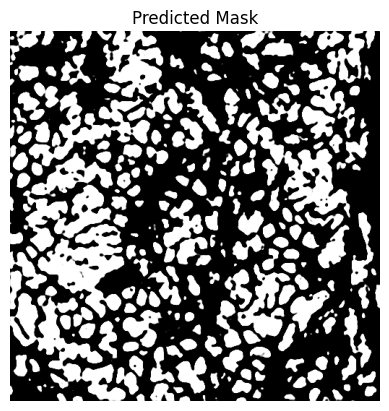

In [ ]:
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 5 # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

In [ ]:
import numpy as np

def calculate_dice_coefficient(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)

    dice_coefficient = (2.0 * intersection) / (union + intersection)

    return dice_coefficient


In [ ]:
# Assuming train_files_labels is your ground truth label masks for training set
# Let's use a portion of it for demonstration purposes
num_samples_for_evaluation = 6
y_true_val = []

for i in range(num_samples_for_evaluation):
    y_true_val.append(imread(train_files_labels[i]))

y_true_val = np.array(y_true_val)

# Now, let's calculate the Dice coefficient
dice_scores = []

for i in range(len(y_true_val)):
    dice_coefficient = calculate_dice_coefficient(y_true_val[i, :, :], predictions[i, :, :, 0])
    dice_scores.append(dice_coefficient)

average_dice_score = np.mean(dice_scores)

print(f'Average Dice Coefficient: {average_dice_score}')


Average Dice Coefficient: 0.4743540567992494


**SqueezeUnet Architecture**

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, Dropout, UpSampling2D
from tensorflow.keras.layers import BatchNormalization  # Add this import

def fire_module(x, fire_id, squeeze=16, expand=64):
    f_name = "fire{0}/{1}"
    channel_axis = 3  # Assuming 'channels_last' data format

    x = Conv2D(squeeze, (1, 1), activation='relu', padding='same', name=f_name.format(fire_id, "squeeze1x1"))(x)
    x = BatchNormalization(axis=channel_axis)(x)

    left = Conv2D(expand, (1, 1), activation='relu', padding='same', name=f_name.format(fire_id, "expand1x1"))(x)
    right = Conv2D(expand, (3, 3), activation='relu', padding='same', name=f_name.format(fire_id, "expand3x3"))(x)
    x = concatenate([left, right], axis=channel_axis, name=f_name.format(fire_id, "concat"))
    return x

def SqueezeUNet(inputs, num_classes=1, deconv_ksize=3, dropout=0.5, activation='sigmoid'):
    channel_axis = 3  # Assuming 'channels_last' data format

    x01 = Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu', name='conv1')(inputs)
    x02 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool1', padding='same')(x01)

    x03 = fire_module(x02, fire_id=2, squeeze=16, expand=64)
    x04 = fire_module(x03, fire_id=3, squeeze=16, expand=64)
    x05 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool3', padding="same")(x04)

    x06 = fire_module(x05, fire_id=4, squeeze=32, expand=128)
    x07 = fire_module(x06, fire_id=5, squeeze=32, expand=128)
    x08 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool5', padding="same")(x07)

    x09 = fire_module(x08, fire_id=6, squeeze=48, expand=192)
    x10 = fire_module(x09, fire_id=7, squeeze=48, expand=192)
    x11 = fire_module(x10, fire_id=8, squeeze=64, expand=256)
    x12 = fire_module(x11, fire_id=9, squeeze=64, expand=256)

    if dropout != 0.0:
        x12 = Dropout(dropout)(x12)

    up1 = concatenate([
        Conv2DTranspose(192, deconv_ksize, strides=(1, 1), padding='same')(x12),
        x10,
    ], axis=channel_axis)
    up1 = fire_module(up1, fire_id=10, squeeze=48, expand=192)

    up2 = concatenate([
        Conv2DTranspose(128, deconv_ksize, strides=(1, 1), padding='same')(up1),
        x08,
    ], axis=channel_axis)
    up2 = fire_module(up2, fire_id=11, squeeze=32, expand=128)

    up3 = concatenate([
        Conv2DTranspose(64, deconv_ksize, strides=(2, 2), padding='same')(up2),
        x05,
    ], axis=channel_axis)
    up3 = fire_module(up3, fire_id=12, squeeze=16, expand=64)

    up4 = concatenate([
        Conv2DTranspose(32, deconv_ksize, strides=(2, 2), padding='same')(up3),
        x02,
    ], axis=channel_axis)
    up4 = fire_module(up4, fire_id=13, squeeze=16, expand=32)
    up4 = UpSampling2D(size=(2, 2))(up4)

    x = concatenate([up4, x01], axis=channel_axis)
    x = Conv2D(64, (3, 3), strides=(1, 1), padding='same', activation='relu')(x)
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(num_classes, (1, 1), activation=activation)(x)

    model = Model(inputs=inputs, outputs=x)
    return model


input_shape = (512, 512, 3)
inputs = Input(input_shape)
model = SqueezeUNet(inputs)
model.summary()



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv1 (Conv2D)              (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 pool1 (MaxPooling2D)        (None, 128, 128, 64)         0         ['conv1[0][0]']               
                                                                                                  
 fire2/squeeze1x1 (Conv2D)   (None, 128, 128, 16)         1040      ['pool1[0][0]']               
                                                                                              

In [ ]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize

# Function to load and preprocess images
def load_images(file_paths, image_size):
    images = []
    normalizer = stainNorm_Reinhard.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        image = imread(file_path)[:, :, :3] / 255.0  # Normalize to [0, 1]

            # Apply stain normalization if specified
        normalizer.fit(image)
        image = normalizer.transform(image)

        image = normalize(image)  # Further normalization if needed
        # Add any additional preprocessing steps here
        images.append(image)
    return np.array(images)

# Function to load label masks
# Function to load label masks
def load_masks(file_paths, image_size):
    masks = []
    normalizer = stainNorm_Reinhard.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        mask = imread(file_path)

        # # Check if the image is grayscale
        # if len(mask.shape) == 2:
        #     mask = np.expand_dims(mask, axis=-1)  # Add a single channel for compatibility

        mask = mask / 255.0  # Normalize to [0, 1]

        # Apply stain normalization if specified

          # Further normalization if needed
        # Add any additional preprocessing steps here
        masks.append(mask)

    return np.array(masks)


# Assuming you have defined image_size (adjust based on your requirements)
image_size = (512, 512)
# normalization_method = 'Reinhard'  # Change this to the desired method

# Load and preprocess the data
X_train = load_images(train_files, image_size)
y_train = load_masks(train_files_mask, image_size)

# (Optional) Split the data into training and validation sets
# You can use tools like train_test_split from sklearn
# Example:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Display the shapes of the loaded data
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)


X_train shape: (24, 512, 512, 3)
y_train shape: (24, 512, 512)
X_test shape: (6, 512, 512, 3)
y_test shape: (6, 512, 512)


In [ ]:
from tensorflow.keras.losses import binary_crossentropy
import tensorflow as tf

# Define the Dice coefficient function
def dice_coefficient(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Define the Dice loss function
def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)


model.compile(optimizer='adam', loss=dice_loss, metrics=[dice_coefficient])

# Step 4: Train the model
# Assuming you have separate arrays for training images and masks
model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_val, y_val))

# Step 5: Evaluate the model (optional)
# Assuming you have separate arrays for validation images and masks
loss, dice_coeff = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Dice Coefficient: {dice_coeff}")

# Step 6: Make predictions
# Assuming you have a test set (X_test) for which you want to make predictions
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()


Epoch 1/10


Epoch 1/10
6/6 [==============================] - 31s 830ms/step - loss: 0.5533 - accuracy: 0.6949 - val_loss: 0.6070 - val_accuracy: 0.7293
Epoch 2/10
6/6 [==============================] - 1s 140ms/step - loss: 0.3904 - accuracy: 0.8100 - val_loss: 0.6141 - val_accuracy: 0.7293
Epoch 3/10
6/6 [==============================] - 1s 117ms/step - loss: 0.3481 - accuracy: 0.8365 - val_loss: 0.5875 - val_accuracy: 0.7395
Epoch 4/10
6/6 [==============================] - 1s 118ms/step - loss: 0.3224 - accuracy: 0.8553 - val_loss: 0.5591 - val_accuracy: 0.7634
Epoch 5/10
6/6 [==============================] - 1s 125ms/step - loss: 0.3144 - accuracy: 0.8540 - val_loss: 0.5347 - val_accuracy: 0.7783
Epoch 6/10
6/6 [==============================] - 1s 139ms/step - loss: 0.3025 - accuracy: 0.8644 - val_loss: 0.5240 - val_accuracy: 0.8220
Epoch 7/10
6/6 [==============================] - 1s 119ms/step - loss: 0.2951 - accuracy: 0.8701 - val_loss: 0.5016 - val_accuracy: 0.7954
Epoch 8/10
6/6 [===

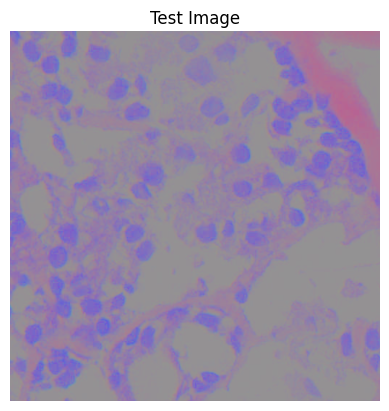

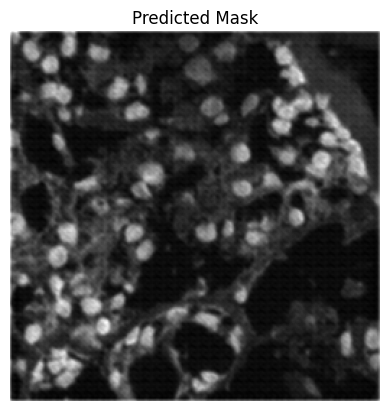

In [ ]:
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_val, y_val))

# Evaluate the model
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Accuracy: {accuracy}")

# Make predictions
predictions = model.predict(X_val)

# Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

In [ ]:
model.save('model3.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 1/200
6/6 [==============================] - 16s 317ms/step - loss: 0.2939 - accuracy: 0.8684 - val_loss: 0.4718 - val_accuracy: 0.8410
Epoch 2/200
6/6 [==============================] - 1s 125ms/step - loss: 0.3051 - accuracy: 0.8663 - val_loss: 0.4456 - val_accuracy: 0.7615
Epoch 3/200
6/6 [==============================] - 1s 158ms/step - loss: 0.2672 - accuracy: 0.8813 - val_loss: 0.4348 - val_accuracy: 0.7651
Epoch 4/200
6/6 [==============================] - 1s 123ms/step - loss: 0.2601 - accuracy: 0.8847 - val_loss: 0.4278 - val_accuracy: 0.7683
Epoch 5/200
6/6 [==============================] - 1s 123ms/step - loss: 0.2684 - accuracy: 0.8814 - val_loss: 0.4228 - val_accuracy: 0.7728
Epoch 6/200
6/6 [==============================] - 1s 117ms/step - loss: 0.2577 - accuracy: 0.8869 - val_loss: 0.4344 - val_accuracy: 0.7533
Epoch 7/200
6/6 [==============================] - 1s 117ms/step - loss: 0.2751 - accuracy: 0.8822 - val_loss: 0.4059 - val_accuracy: 0.8051
Epoch 8/200


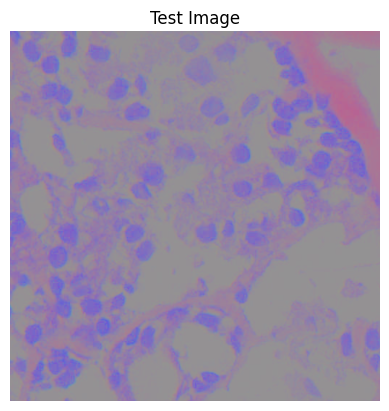

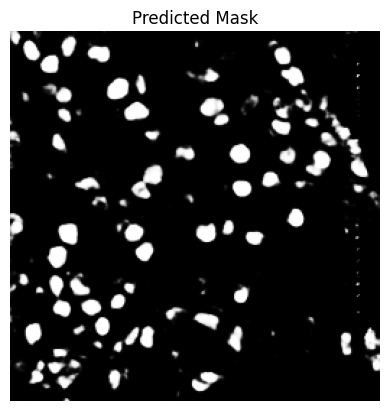

In [ ]:
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=4, validation_data=(X_val, y_val))

# Evaluate the model
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Accuracy: {accuracy}")

# Make predictions
predictions = model.predict(X_val)

# Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

Epoch 1/200
6/6 [==============================] - 32s 1s/step - loss: 0.5124 - accuracy: 0.7523 - val_loss: 0.5759 - val_accuracy: 0.7293
Epoch 2/200
6/6 [==============================] - 1s 127ms/step - loss: 0.3995 - accuracy: 0.7824 - val_loss: 0.5654 - val_accuracy: 0.7293
Epoch 3/200
6/6 [==============================] - 1s 114ms/step - loss: 0.3692 - accuracy: 0.8375 - val_loss: 0.5457 - val_accuracy: 0.7293
Epoch 4/200
6/6 [==============================] - 1s 114ms/step - loss: 0.3345 - accuracy: 0.8535 - val_loss: 0.5048 - val_accuracy: 0.7294
Epoch 5/200
6/6 [==============================] - 1s 130ms/step - loss: 0.3300 - accuracy: 0.8592 - val_loss: 0.4798 - val_accuracy: 0.7389
Epoch 6/200
6/6 [==============================] - 1s 115ms/step - loss: 0.3106 - accuracy: 0.8640 - val_loss: 0.4583 - val_accuracy: 0.7489
Epoch 7/200
6/6 [==============================] - 1s 115ms/step - loss: 0.3116 - accuracy: 0.8605 - val_loss: 0.4578 - val_accuracy: 0.7321
Epoch 8/200
6/6

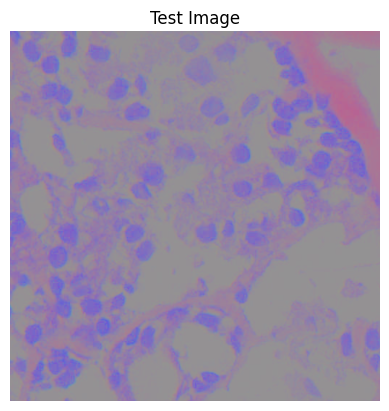

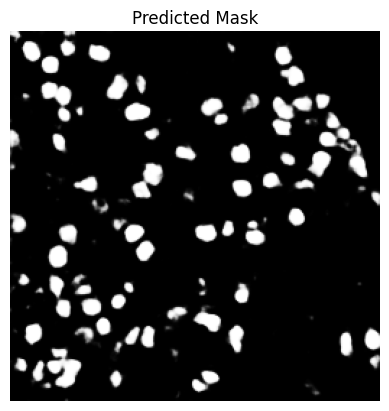

In [ ]:
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=4, validation_data=(X_val, y_val))

# Evaluate the model
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Accuracy: {accuracy}")

# Make predictions
predictions = model.predict(X_val)

# Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

1/1 [==============================] - 2s 2s/step


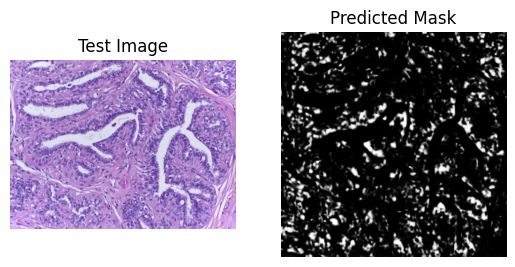

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a test image
test_image_path = '/content/i1.png'  # Update with the path to your test image
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

desired_width =512
desired_height=512
# Preprocess the test image
# Assuming desired_height, desired_width are the dimensions your model expects
input_image = cv2.resize(test_image, (desired_width, desired_height))
input_image = input_image / 255.0  # Normalize pixel values to [0, 1]
input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension

# Use model.predict to obtain the predicted mask
predicted_mask = model.predict(input_image)

# Visualize the test image
plt.subplot(1, 2, 1)
plt.imshow(test_image)
plt.title('Test Image')
plt.axis('off')

# Visualize the predicted mask
plt.subplot(1, 2, 2)
plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')  # Assuming a single-channel mask
plt.title('Predicted Mask')
plt.axis('off')

plt.show()


In [ ]:
model.save('model4.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


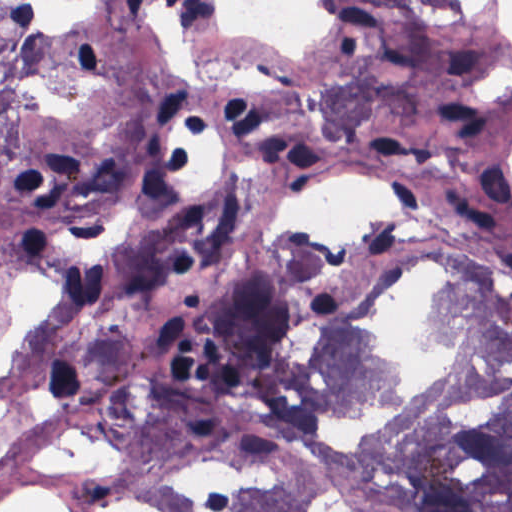

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Read the original image (assuming it's in the same directory as the notebook)
original_image = cv2.imread('/content/tissue images/Human_AdrenalGland_01.tif', cv2.IMREAD_COLOR)

# Display the original image
cv2_imshow(original_image)


In [ ]:
!pip install tensorflow-model-optimization


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 2.3 MB/s eta 0:00:00


In [ ]:
! pip install -q tensorflow-model-optimization

In [ ]:
import tempfile
import os

import tensorflow as tf
import numpy as np

from tensorflow_model_optimization.python.core.keras.compat import keras

%load_ext tensorboard

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose

def create_unet(input_shape=(512, 512, 3)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # ...

    # Decoder
    up3 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv2), conv1], axis=3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)

    # ...

    # Output layer
    output = Conv2D(1, (1, 1), activation='sigmoid')(conv3)  # Using 'conv3' instead of 'conv9'

    model = Model(inputs=[inputs], outputs=[output])
    return model

# Example usage:
input_shape = (512, 512, 3)
model = create_unet(input_shape)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 512, 512, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 256, 256, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [ ]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize

# Function to load and preprocess images
def load_images(file_paths, image_size):
    images = []
    normalizer = stainNorm_Macenko.Normalizer()  # Initialize the ReinhardColorNormalizer

    for file_path in file_paths:
        image = imread(file_path)[:, :, :3] / 255.0  # Normalize to [0, 1]

            # Apply stain normalization if specified
        normalizer.fit(image)
        image = normalizer.transform(image)

        image = normalize(image)  # Further normalization if needed
        # Add any additional preprocessing steps here
        images.append(image)
    return np.array(images)

# Function to load label masks
# Function to load label masks
def load_masks(file_paths, image_size):
    masks = []


    for file_path in file_paths:
        mask = imread(file_path)


        mask = mask / 255.0  # Normalize to [0, 1]
        masks.append(mask)

    return np.array(masks)



image_size = (512, 512)

X_train = load_images(train_files, image_size)
y_train = load_masks(train_files_mask, image_size)


from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Display the shapes of the loaded data
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)


X_train shape: (24, 512, 512, 3)
y_train shape: (24, 512, 512)
X_test shape: (6, 512, 512, 3)
y_test shape: (6, 512, 512)


In [ ]:
import numpy as np
import tensorflow_model_optimization as tfmot
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose

def create_unet(input_shape=(512, 512, 3)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # ...

    # Decoder
    up3 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv2), conv1], axis=3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)

    # ...

    # Output layer
    output = Conv2D(1, (1, 1), activation='sigmoid')(conv3)  # Using 'conv3' instead of 'conv9'

    model = Model(inputs=[inputs], outputs=[output])
    return model

# Apply pruning to the model
def apply_pruning_to_model(model):
    prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

    # Compute end step to finish pruning after 2 epochs.
    batch_size = 128
    epochs = 2
    validation_split = 0.1  # 10% of training set will be used for validation set.

    num_images = X_train.shape[0] * (1 - validation_split)
    end_step = np.ceil(num_images / batch_size).astype(np.int32) * epochs

    # Define pruning parameters
    pruning_params = {
        'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(
            initial_sparsity=0.50,
            final_sparsity=0.80,
            begin_step=0,
            end_step=end_step
        )
    }

    # Apply pruning
    model_for_pruning = prune_low_magnitude(model, **pruning_params)

    return model_for_pruning

# Example usage:
input_shape = (512, 512, 3)
model = create_unet(input_shape)
pruned_model = apply_pruning_to_model(model)
pruned_model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 prune_low_magnitude_conv2d  (None, 512, 512, 64)         3522      ['input_2[0][0]']             
 _7 (PruneLowMagnitude)                                                                           
                                                                                                  
 prune_low_magnitude_conv2d  (None, 512, 512, 64)         73794     ['prune_low_magnitude_conv2d_7
 _8 (PruneLowMagnitude)                                             [0][0]']                      
                                                                                            

In [ ]:
def dice_coefficient(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Define the Dice loss function
def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)

In [ ]:
# `prune_low_magnitude` requires a recompile.
pruned_model.compile(optimizer='adam',
              loss='dice_loss',
              metrics=[dice_coefficient])

In [ ]:
import tensorflow as tf
import tempfile
import tensorflow_model_optimization as tfmot

def dice_coefficient(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Define the Dice loss function
def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)

# Compile the pruned model
pruned_model.compile(optimizer='adam',
              loss=dice_loss,
              metrics=[dice_coefficient])

logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

pruned_model.fit(X_train, y_train,
                  batch_size=3, epochs=3, validation_split=0.1,
                  callbacks=callbacks)


Epoch 1/3
6/7 [========================>.....] - ETA: 0s - loss: 0.6002 - dice_coefficient: 0.3998

7/7 [==============================] - 6s 301ms/step - loss: 0.6189 - dice_coefficient: 0.3811 - val_loss: 0.6908 - val_dice_coefficient: 0.3092
Epoch 2/3
7/7 [==============================] - 2s 270ms/step - loss: 0.6224 - dice_coefficient: 0.3776 - val_loss: 0.6908 - val_dice_coefficient: 0.3092
Epoch 3/3
7/7 [==============================] - 2s 256ms/step - loss: 0.6187 - dice_coefficient: 0.3813 - val_loss: 0.6908 - val_dice_coefficient: 0.3092


In [ ]:
# `prune_low_magnitude` requires a recompile.
pruned_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

pruned_model.fit(X_train, y_train,
                  batch_size=4, epochs=10, validation_split=0.1,
                  callbacks=callbacks)

Epoch 1/10
6/6 [==============================] - 34s 2s/step - loss: 0.6218 - accuracy: 0.7623 - val_loss: 0.4893 - val_accuracy: 0.8171
Epoch 2/10
6/6 [==============================] - 2s 305ms/step - loss: 0.5587 - accuracy: 0.7623 - val_loss: 0.4908 - val_accuracy: 0.8171
Epoch 3/10
6/6 [==============================] - 2s 307ms/step - loss: 0.4837 - accuracy: 0.7623 - val_loss: 0.3869 - val_accuracy: 0.8171
Epoch 4/10
6/6 [==============================] - 2s 310ms/step - loss: 0.3863 - accuracy: 0.8139 - val_loss: 0.3211 - val_accuracy: 0.8773
Epoch 5/10
6/6 [==============================] - 2s 302ms/step - loss: 0.3273 - accuracy: 0.8658 - val_loss: 0.3529 - val_accuracy: 0.8166
Epoch 6/10
6/6 [==============================] - 2s 293ms/step - loss: 0.3010 - accuracy: 0.8653 - val_loss: 0.2759 - val_accuracy: 0.8760
Epoch 7/10
6/6 [==============================] - 2s 308ms/step - loss: 0.3146 - accuracy: 0.8510 - val_loss: 0.4382 - val_accuracy: 0.8479
Epoch 8/10
6/6 [======

In [ ]:
pruned_model.save('pruned_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Quantization**

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()


In [ ]:
len(tflite_model)

1621364

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_quant_model = converter.convert()

In [ ]:
tflite_model_path = 'quant_model.tflite'

with open(tflite_model_path, 'wb') as f:
    f.write(tflite_quant_model)

print("Quantized TensorFlow Lite model saved at:", tflite_model_path)

Quantized TensorFlow Lite model saved at: quant_model.tflite


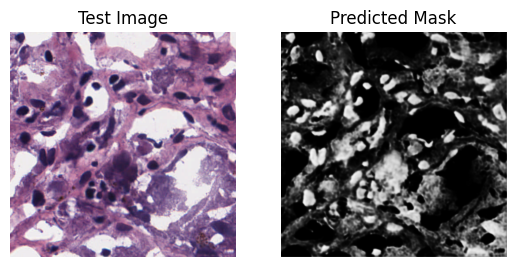

Test Image Base64: iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAAgAElEQVR4AcTB2a+vaXYf9O9a63me931/457PUOecmruquqrabXfbMUE4YCyiXPAP5Qa4QeIiAiRuEEhIIOUikQiSSRQJRMAIY4htEbuHGrrGM+/pN77TM6zF3nYuWmjfWnw+9Mf/8A8nB4vm6JT9khuRCpxb7dYpjlFcDlVoa504Jdiqw0VHSny2oPtL3+yG10P7bdtdpKxBpsuwOPb1fPE79elBN3G53zSxT01YV8GpHqe8w12KAQYUwHCLAAEInmCAAQoooIABBizFK/RGLiWnkmPRqJptP65JmYsTeOc9N16mQoGzl9Jb2lvuNKtaUEyMantc17iLk9o4Z0vDPu8v4/aq27XbofR6sU67Nl7vdD8ga1Ttcu5z6vuVJi2DlWhmDC8UHHnhwZOrxNcSxDnIDaoIlassqbXjbnf9zeb159vrl22vqVTFt0WRCrKqIQslR0m4+PmThvRwOT1+872Tdz89OHw8zeL3fXl4iK5GqzZcGJ6bG8wfgk8lmvpQLZdHj+/fe+f+wb2a6zFrd/7F0O8XF599/d2f/OOvv/zfX3b9XqmM3XJYZj9m10OposP54u3Fwx80Zw8OqKtmh830yBfV7ct2/dV+eNZju/v6uqjGVFIuKZsaGQhEUY/ExVCnyczPlqez5VvT+TuhOoNsWYuzEgSh9mHWuHkjdUXjlYer59PpmyfT9+9Nzw5rq/yAQEMBMlBwSwAHCGAoCcgAAwFgIAMJqH0gA5mRmqkVtWJWzKzvATKDGZmSGmBkQJYREIMjFnEiAc6DxXzELQIIYIAAwo2y87hBBgLIwAAZbrCCAAYYtxRQwAAW3EVwt4K7FQMMKIDhFgECEI56v590q+56/eX57ovz9evr9fVuvxr79KJvY78b45CKlmSlyzpmPV1yqJpmdlRP74k71OJSHEru99sXRMwQY

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import base64

# Load the quantized TensorFlow Lite model
interpreter = tf.lite.Interpreter(model_path='/content/quant_model.tflite')
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Load a test image
test_image_path = '/content/tissue images/Human_AdrenalGland_01.tif'  # Update with the path to your test image
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

# Preprocess the test image
# Assuming desired_height, desired_width are the dimensions your model expects
desired_height = 512
desired_width = 512
input_image = cv2.resize(test_image, (desired_width, desired_height))
input_image = input_image.astype(np.float32) / 255.0  # Convert to float32 and normalize to [0, 1]
input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension

# Set input tensor
interpreter.set_tensor(input_details[0]['index'], input_image)

# Run inference
interpreter.invoke()

# Get the output tensor
output_tensor = interpreter.get_tensor(output_details[0]['index'])

# Convert the test image and predicted mask to base64 strings
_, test_image_encoded = cv2.imencode('.png', test_image)
test_image_base64 = base64.b64encode(test_image_encoded).decode('utf-8')

_, predicted_mask_encoded = cv2.imencode('.png', output_tensor[0, :, :, 0])
predicted_mask_base64 = base64.b64encode(predicted_mask_encoded).decode('utf-8')

# Visualize the test image
plt.subplot(1, 2, 1)
plt.imshow(test_image)
plt.title('Test Image')
plt.axis('off')

# Visualize the predicted mask
plt.subplot(1, 2, 2)
plt.imshow(output_tensor[0, :, :, 0], cmap='gray')  # Assuming a single-channel mask
plt.title('Predicted Mask')
plt.axis('off')

plt.show()

# Output the base64 strings
print("Test Image Base64:", test_image_base64)
print("Predicted Mask Base64:", predicted_mask_base64)


In [ ]:
print("Test Image Base64:", test_image_base64)

Test Image Base64: iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAAgAElEQVR4AcTB2a+vaXYf9O9a63me931/457PUOecmruquqrabXfbMUE4YCyiXPAP5Qa4QeIiAiRuEEhIIOUikQiSSRQJRMAIY4htEbuHGrrGM+/pN77TM6zF3nYuWmjfWnw+9Mf/8A8nB4vm6JT9khuRCpxb7dYpjlFcDlVoa504Jdiqw0VHSny2oPtL3+yG10P7bdtdpKxBpsuwOPb1fPE79elBN3G53zSxT01YV8GpHqe8w12KAQYUwHCLAAEInmCAAQoooIABBizFK/RGLiWnkmPRqJptP65JmYsTeOc9N16mQoGzl9Jb2lvuNKtaUEyMantc17iLk9o4Z0vDPu8v4/aq27XbofR6sU67Nl7vdD8ga1Ttcu5z6vuVJi2DlWhmDC8UHHnhwZOrxNcSxDnIDaoIlassqbXjbnf9zeb159vrl22vqVTFt0WRCrKqIQslR0m4+PmThvRwOT1+872Tdz89OHw8zeL3fXl4iK5GqzZcGJ6bG8wfgk8lmvpQLZdHj+/fe+f+wb2a6zFrd/7F0O8XF599/d2f/OOvv/zfX3b9XqmM3XJYZj9m10OposP54u3Fwx80Zw8OqKtmh830yBfV7ct2/dV+eNZju/v6uqjGVFIuKZsaGQhEUY/ExVCnyczPlqez5VvT+TuhOoNsWYuzEgSh9mHWuHkjdUXjlYer59PpmyfT9+9Nzw5rq/yAQEMBMlBwSwAHCGAoCcgAAwFgIAMJqH0gA5mRmqkVtWJWzKzvATKDGZmSGmBkQJYREIMjFnEiAc6DxXzELQIIYIAAwo2y87hBBgLIwAAZbrCCAAYYtxRQwAAW3EVwt4K7FQMMKIDhFgECEI56v590q+56/eX57ovz9evr9fVuvxr79KJvY78b45CKlmSlyzpmPV1yqJpmdlRP74k71OJSHEru99sXRMwQY

In [ ]:
print("Predicted Mask Base64:", predicted_mask_base64)


Predicted Mask Base64: iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAAAAADRE4smAAAgAElEQVR4AezBC2KqCAAEsMz9Dz2Lf1BQaNXa7kviZ8VF3RGDuoiR+lFBrRb1KeJnxUgti0GdxUT9pNiplYL6DPE+qRtxUXfEoM7iWv2Y2Kt1Yqeuhdoq1NfF+6RuxVndEdRFzKgfkga1VgzqSlAbBfVl8T5RN+Kk7kqNxbz6IUF9SxzUBjGor4oZcVTPFHUrjmqLWFA/JNQ3xUGtF+rL4kac1VOlbsVBbRML6mcEdSXUFrFXbxJXYqyeKepW7NVGsaB+QgzqLC5qixjUe8RYXKlniroVe7VRLKifEIM6iCu1Sai3iJG4Vs+UmhE7tVUsqJ8Qg9qLW7VJ6i3iIm7Vy8VObRUL6kcEtRez6vPERdyq14tBbRQL6odE7cWC+jhxEbfq9WJQW8Sy+mmxpD5NXMSteodQW8SS+nFxR32WuIhb9RZRG8SVip36AHFPfZS4iFv1iWKqBlEfIe6qTxIXcas+UUzUR4n76oPESFyrjxRj9WHigfoYMRZX6jPFRX2ceKA+RUzERH2oOKlPFA/Uh4ipGKlPFQf12WJJfYa4Fmf1qeKgPl7MqhWiXixuxUF9rNirXyFu1WNBvVbMiL36WLFTv0mM1WMxqJeKGbFTHyyo3yh26rE4qBeKOUF9tKhfKtQKMVKvEf98qBir14gfEdQ/d8REvUb8hBjUP3fESb1Q/ITYqX+WBfVy8TNC/XNP1OvFPx8q9QbxLFH/PFHU68Uaof55q6BeLlaIQf3zRrFTrxb3xUn980axU68W98RF/fNOMai9oF4i7oi9+ucHRO3FTr1ELIu9+me7UE8SO/UKsSgO6p/N4qjuSa0Rg3qFWBR79c92cVJ3RK0Qg3qFWBIH9c92cVJ3hFoh1EvEkjiofzaLs7oj1KKovaBeIhbEUf2zWZzVHaEWxV5jUC8RE6mjOKqtgvo/i

In [ ]:
len(tflite_quant_model)

419160

In [ ]:
logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

pruned_model.fit(X_train, y_train,
                  batch_size=2, epochs=2, validation_split=0.1,
                  callbacks=callbacks)

Epoch 1/2
 6/11 [===============>..............] - ETA: 0s - loss: 0.5691 - accuracy: 0.7371

11/11 [==============================] - 46s 580ms/step - loss: 0.5269 - accuracy: 0.7623 - val_loss: 0.3905 - val_accuracy: 0.8171
Epoch 2/2
11/11 [==============================] - 2s 165ms/step - loss: 0.3895 - accuracy: 0.7971 - val_loss: 0.3161 - val_accuracy: 0.8692


In [ ]:
logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

pruned_model.fit(X_train, y_train,
                  batch_size=2, epochs=5, validation_split=0.1,
                  callbacks=callbacks)

Epoch 1/5
 6/11 [===============>..............] - ETA: 0s - loss: 0.2755 - accuracy: 0.8783

11/11 [==============================] - 2s 182ms/step - loss: 0.2724 - accuracy: 0.8800 - val_loss: 0.2796 - val_accuracy: 0.8721
Epoch 2/5
11/11 [==============================] - 2s 174ms/step - loss: 0.2727 - accuracy: 0.8812 - val_loss: 0.3007 - val_accuracy: 0.8695
Epoch 3/5
11/11 [==============================] - 2s 167ms/step - loss: 0.2664 - accuracy: 0.8813 - val_loss: 0.2733 - val_accuracy: 0.8746
Epoch 4/5
11/11 [==============================] - 2s 163ms/step - loss: 0.2684 - accuracy: 0.8814 - val_loss: 0.2740 - val_accuracy: 0.8706
Epoch 5/5
11/11 [==============================] - 2s 170ms/step - loss: 0.2673 - accuracy: 0.8841 - val_loss: 0.2977 - val_accuracy: 0.8690


In [ ]:
_, model_for_pruning_accuracy = pruned_model.evaluate(
   X_val, y_val, verbose=0)

print('Pruned test accuracy:', model_for_pruning_accuracy)

Pruned test accuracy: 0.8854802250862122


In [ ]:
import tensorflow as tf

# Print the model summary
model.summary()

# Check the type of the model
print(type(model))

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d_44 (Conv2D)          (None, 512, 512, 64)         1792      ['input_10[0][0]']            
                                                                                                  
 conv2d_45 (Conv2D)          (None, 512, 512, 64)         36928     ['conv2d_44[0][0]']           
                                                                                                  
 max_pooling2d_12 (MaxPooli  (None, 256, 256, 64)         0         ['conv2d_45[0][0]']           
 ng2D)                                                                                      

In [ ]:
import numpy as np

# Define batch_size, epochs, and validation_split
batch_size = 4
epochs = 2
validation_split = 0.2

# Compute the number of images for training after excluding the validation split
num_images = X_train.shape[0] * (1 - validation_split)

# Calculate the end_step using the given formula
end_step = np.ceil(num_images / batch_size).astype(np.int32) * epochs


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, Dropout, UpSampling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
import tensorflow_model_optimization as tfmot
from tensorflow_model_optimization.python.core.keras.compat import keras
import tensorflow_model_optimization as tfmot

def fire_module(x, fire_id, squeeze=16, expand=64):
    f_name = "fire{0}/{1}"
    channel_axis = 3  # Assuming 'channels_last' data format

    x = Conv2D(squeeze, (1, 1), activation='relu', padding='same', name=f_name.format(fire_id, "squeeze1x1"))(x)
    x = BatchNormalization(axis=channel_axis)(x)

    left = Conv2D(expand, (1, 1), activation='relu', padding='same', name=f_name.format(fire_id, "expand1x1"))(x)
    right = Conv2D(expand, (3, 3), activation='relu', padding='same', name=f_name.format(fire_id, "expand3x3"))(x)
    x = concatenate([left, right], axis=channel_axis, name=f_name.format(fire_id, "concat"))
    return x

def SqueezeUNet(inputs, num_classes=1, deconv_ksize=3, dropout=0.5, activation='sigmoid'):
    channel_axis = 3  # Assuming 'channels_last' data format

    x01 = Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu', name='conv1')(inputs)
    x02 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool1', padding='same')(x01)

    x03 = fire_module(x02, fire_id=2, squeeze=16, expand=64)
    x04 = fire_module(x03, fire_id=3, squeeze=16, expand=64)
    x05 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool3', padding="same")(x04)

    x06 = fire_module(x05, fire_id=4, squeeze=32, expand=128)
    x07 = fire_module(x06, fire_id=5, squeeze=32, expand=128)
    x08 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool5', padding="same")(x07)

    x09 = fire_module(x08, fire_id=6, squeeze=48, expand=192)
    x10 = fire_module(x09, fire_id=7, squeeze=48, expand=192)
    x11 = fire_module(x10, fire_id=8, squeeze=64, expand=256)
    x12 = fire_module(x11, fire_id=9, squeeze=64, expand=256)

    if dropout != 0.0:
        x12 = Dropout(dropout)(x12)

    up1 = concatenate([
        Conv2DTranspose(192, deconv_ksize, strides=(1, 1), padding='same')(x12),
        x10,
    ], axis=channel_axis)
    up1 = fire_module(up1, fire_id=10, squeeze=48, expand=192)

    up2 = concatenate([
        Conv2DTranspose(128, deconv_ksize, strides=(1, 1), padding='same')(up1),
        x08,
    ], axis=channel_axis)
    up2 = fire_module(up2, fire_id=11, squeeze=32, expand=128)

    up3 = concatenate([
        Conv2DTranspose(64, deconv_ksize, strides=(2, 2), padding='same')(up2),
        x05,
    ], axis=channel_axis)
    up3 = fire_module(up3, fire_id=12, squeeze=16, expand=64)

    up4 = concatenate([
        Conv2DTranspose(32, deconv_ksize, strides=(2, 2), padding='same')(up3),
        x02,
    ], axis=channel_axis)
    up4 = fire_module(up4, fire_id=13, squeeze=16, expand=32)
    up4 = UpSampling2D(size=(2, 2))(up4)

    x = concatenate([up4, x01], axis=channel_axis)
    x = Conv2D(64, (3, 3), strides=(1, 1), padding='same', activation='relu')(x)
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(num_classes, (1, 1), activation=activation)(x)

    model = Model(inputs=inputs, outputs=x)
    return model

# Define the model and input shape
input_shape = (512, 512, 3)
inputs = Input(input_shape)
model = SqueezeUNet(inputs)

# Prune the model
prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude
pruning_params = {
      'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=0.50,
                                                               final_sparsity=0.80,
                                                               begin_step=0,
                                                               end_step=end_step)
}

model_for_pruning = prune_low_magnitude(model, **pruning_params)

# `prune_low_magnitude` requires a recompile.
model_for_pruning.compile(optimizer='adam',
                          loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                          metrics=['accuracy'])

model_for_pruning.summary()


Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_12 (InputLayer)       [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 prune_low_magnitude_conv1   (None, 256, 256, 64)         3522      ['input_12[0][0]']            
 (PruneLowMagnitude)                                                                              
                                                                                                  
 prune_low_magnitude_pool1   (None, 128, 128, 64)         1         ['prune_low_magnitude_conv1[0]
 (PruneLowMagnitude)                                                [0]']                         
                                                                                           